In [2]:
import numpy as np
import os
import glob
import time

# image processing
from skimage import color, exposure, transform, io
from PIL import Image
import cv2 as cv

# nn
import tensorflow as tf
from tensorflow.keras.models import load_model

# viz
import matplotlib.pyplot as plt

In [3]:
%matplotlib inline

In [4]:
dic = {
    0:'Speed limit - 20',
    1:'Speed limit - 30',
    2:'Speed limit - 50',
    3:'Speed limit - 60',
    4:'Speed limit - 70',
    5:'Speed limit - 80',
    6:'Speed limit - 100',
    7:'Speed limit - 120',
    8:'No Car',
    9:'No Motorcycle',
    10:'No Bicycle',
    11:'No Truck',
    12:'No Pedestrian',
    13:'No Bus',
    14:'No Parking and Stopping',
    15:'No Parking',
    16:'No Entry 2',
    17:'No Entry 1',
    18:'No Right Turn',
    19:'No Left Turn',
    20:'No Uturn',
    21:'No Overtaking',
    22:'No Truck in the Specified Lane',
    
    23:'Tunnel Ahead',
    24:'Domestic Animals!',
    25:'Pedestrian Crossing',
    26:'Traffic Light!',
    27:'Pedestrian Crossing!',
    28:'Bump!',
    
    29:'End of no Overtaking',
    30:'End of Previous Limitation',
    31:'End of Speed Limit',
    
    32:'Bus Station',
    33:'Wild Animals!',
    34:'Deadend',
    35:'One-way Road',
    36:'School!',
    
    37:'Height Limit',
    38:'Width Limit',
    39:'Length Limit',
    40:'Weight Limit',
    
    41:'Tire Chains',
    
    42:'Rock Fall!',
    43:'Steep!',
}

In [4]:
NUM_CLASSES = 44
IMG_SIZE = 48

def preprocess_img(img):
    img = color.rgb2gray(img)
    img = transform.resize(img, (IMG_SIZE, IMG_SIZE))

    return img

In [5]:
# Tiling dependencies
from sahi.model import Yolov5DetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [6]:
# Detector
detection_model = Yolov5DetectionModel(
model_path='weights/best.pt',
confidence_threshold=0.7,
device="cuda:0", # or 'cuda:0'
)

01/24/2022 15:36:40 - INFO - yolov5.models.yolo -   
                 from  n    params  module                                  arguments                     
01/24/2022 15:36:40 - INFO - yolov5.models.yolo -     0                -1  1      3520  yolov5.models.common.Conv               [3, 32, 6, 2, 2]              
01/24/2022 15:36:40 - INFO - yolov5.models.yolo -     1                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
01/24/2022 15:36:40 - INFO - yolov5.models.yolo -     2                -1  1     18816  yolov5.models.common.C3                 [64, 64, 1]                   
01/24/2022 15:36:40 - INFO - yolov5.models.yolo -     3                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
01/24/2022 15:36:40 - INFO - yolov5.models.yolo -     4                -1  2    115712  yolov5.models.common.C3                 [128, 128, 2]                 
01/24/2022 15:36:40 - INFO - yolov5.models.yo

In [7]:
# Classifier
model = load_model('model.h5') 

2022-01-24 15:36:40.585644: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-24 15:36:40.634374: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-24 15:36:40.635369: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-01-24 15:36:40.637594: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

# Detections (Outputs of Detector Model)

In [113]:
IMG_PATH = 'app_data/images/neshan-test/detection'
LABEL_PATH = 'app_data/labels'

In [114]:
start = time.time()
for image in os.listdir(IMG_PATH):
    # Detection
    #result = get_prediction(os.path.join(IMG_PATH, image), detection_model)
    
    result = get_sliced_prediction(
    os.path.join(IMG_PATH, image),
    detection_model,
    slice_height = 1024,
    slice_width = 2048,
    overlap_height_ratio = 0,
    overlap_width_ratio = 0,
    )
    result = result.to_coco_annotations()

    # Read Image
    img = io.imread(os.path.join(IMG_PATH, image))
    h, w, c = img.shape
    
    # Store the detected objects and predict
    annotation = []

    for obj in result:
        x = obj['bbox'][0]
        y = obj['bbox'][1]
        width = obj['bbox'][2]
        height = obj['bbox'][3]

        obj_img =  img[y:y+height, x:x+width]
        obj_img = preprocess_img(obj_img)
        obj_img = np.expand_dims(obj_img, 0)

        # Recognition
        predict = model.predict(obj_img)
        label = np.argmax(predict, axis=1)[0]

        # save the annotation in YOLO format
        annot = [label, (x+width/2)/w, (y+height/2)/h, width/w, height/h]
        annotation.append(annot)
    np.savetxt(os.path.join(LABEL_PATH, image.replace(image[-4:], '.txt')), annotation, fmt='%.10g')
end = time.time()
print(end-start)

Number of slices: 16


2022-01-24 13:51:32.250165: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-01-24 13:51:33.689358: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8204


Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of slices: 16
Number of sli

# Groundtruths (No Detection Involved)

In [ ]:
IMG_PATH = 'images'
LABEL_PATH = 'labels'
OUTPUT = 'outputs'

In [ ]:
for image in os.listdir(IMG_PATH):
    # read groundtruth annotation
    ann = np.loadtxt(os.path.join(LABEL_PATH, image.replace(image[-4:], '.txt'))).tolist()
    
    # read image
    img = io.imread(os.path.join(IMG_PATH, image))
    h, w, c = img.shape
    annotation = []

    # multiple objects
    if type(ann[0]) == list:
        for obj in ann:
            # extract coordinates for cropping
            width = int(obj[3]*w)
            height = int(obj[4]*h)
            x = int(obj[1]*w - width*.5)
            y = int(obj[2]*h - height*.5)
            
            # crop ROI
            obj_img =  img[y:y+height, x:x+width]
            
            # Recognition
            obj_img = preprocess_img(obj_img)
            obj_img = np.expand_dims(obj_img, 0)
            predict = model.predict(obj_img)
            label = np.argmax(predict, axis=1)[0]

            # save the annotation in YOLO format
            annot = [label, (x+width/2)/w, (y+height/2)/h, width/w, height/h]
            annotation.append(annot)
            np.savetxt(os.path.join(OUTPUT, image.replace(image[-4:], '.txt')), annotation, fmt='%.10g')

                
    # single object            
    else:
        # extract coordinates for cropping
        width = int(ann[3]*w)
        height = int(ann[4]*h)
        x = int(ann[1]*w - width*.5)
        y = int(ann[2]*h - height*.5)

        # crop ROI
        obj_img =  img[y:y+height, x:x+width]

        # Recognition
        obj_img = preprocess_img(obj_img)
        obj_img = np.expand_dims(obj_img, 0)
        predict = model.predict(obj_img)
        label = np.argmax(predict, axis=1)[0]

        # save the annotation in YOLO format
        annot = [label, (x+width/2)/w, (y+height/2)/h, width/w, height/h]
        annotation.append(annot)
        np.savetxt(os.path.join(OUTPUT, image.replace(image[-4:], '.txt')), annotation, fmt='%.10g')

# Playground

16 slices: ~ 2.2s per image  
4 slices: ~ 1.85s per image

## Crop to ROI
It decreases the infrence time by ~ 1s  
But reading images from disk, cropping and writing them on the disk takes ~ 1.2s itself (62s for 52 images)

In [48]:
path = 'app_data/images/neshan-test/detection/original/'
roi = 'app_data/images/neshan-test/detection/roi/'

In [50]:
start = time.time()
for image in os.listdir(path):
    img = io.imread(os.path.join(path, image))
    img = img[800:3100, :]
    io.imsave(os.path.join(roi,image), img)
end = time.time()
print(end-start)

64.95646405220032


In [42]:
im = io.imread(image_path)

In [43]:
im = im[800:3300, :]

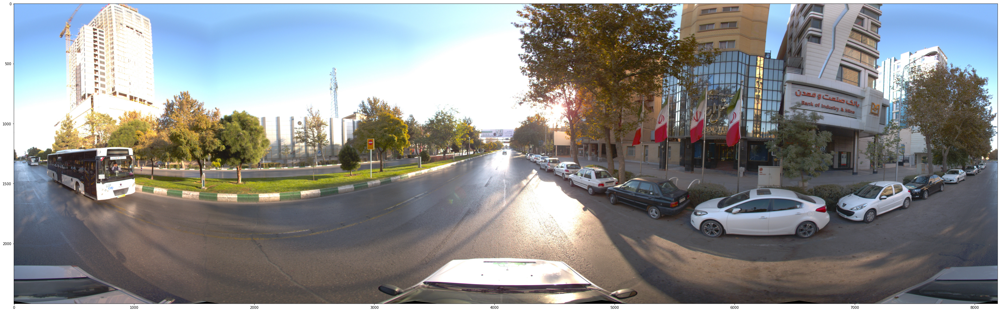

In [44]:
plt.figure(figsize=(50, 50))
plt.imshow(im)

## Explore the image with tiling

In [10]:
import cv2 as cv

In [52]:
# step1: localize
image_path = 'app_data/images/neshan-test/detection/roi/10.jpg'
#result = get_prediction(image_path, detection_model)

start = time.time()
result = get_sliced_prediction(
    image_path,
    detection_model,
    slice_height = 2300,
    slice_width = 2048,
    overlap_height_ratio = 0,
    overlap_width_ratio = 0
)
end = time.time()
print(end-start)
result = result.to_coco_annotations()

Number of slices: 4
1.2105128765106201


In [53]:
img = io.imread(image_path)

In [54]:
for obj in result:
    x = obj['bbox'][0]
    y = obj['bbox'][1]
    w = obj['bbox'][2]
    h = obj['bbox'][3]
    cv.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 3)

In [56]:
io.imsave('haha..jpg', img)

## Detection and Classification

In [8]:
# step1: localize
image_path = 'app_data/images/neshan-test/detection/original/15.jpg'
#result = get_prediction(image_path, detection_model)

result = get_sliced_prediction(
    image_path,
    detection_model,
    slice_height = 1024,
    slice_width = 1024,
    overlap_height_ratio = 0,
    overlap_width_ratio = 0
)
result = result.to_coco_annotations()

Number of slices: 32


In [127]:
len(result)

4

In [131]:
start = time.time()


# step2: extract info
obj = result[1]
x = obj['bbox'][0]
y = obj['bbox'][1]
w = obj['bbox'][2]
h = obj['bbox'][3]


# step3: recognize
image = io.imread(image_path)
obj_img =  image[y:y+h, x:x+w]
pp_img = preprocess_img(obj_img)
img = np.expand_dims(pp_img, 0)

# Recognize
predict = model.predict(img)

if predict.max() > .4:
    label = dic[np.argmax(predict,axis=1)[0]]
else:
    label = 'I don\'t know'

end = time.time()
print(label, (end-start))

No Entry 2 0.497347354888916


In [132]:
predict.max()

0.482683

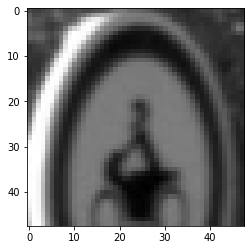

In [133]:
plt.imshow(pp_img, cmap='gray')

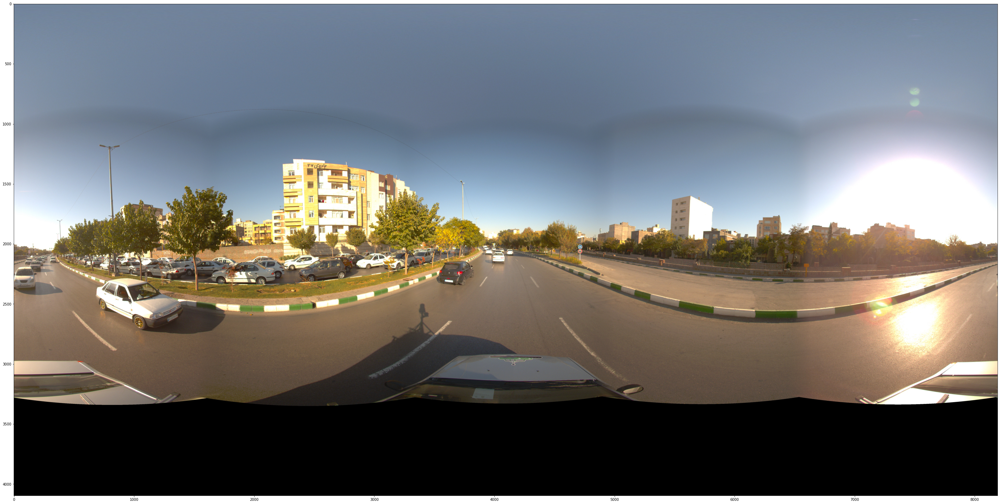

In [54]:
plt.figure(figsize = (50,50))

plt.imshow(image)

## Classification only

In [43]:
start = time.time()


img = io.imread('app_data/images/neshan-test/sl120.jpg')
img = preprocess_img(img)
img = np.expand_dims(img, 0)
predict = model.predict(img)
label = dic[np.argmax(predict,axis=1)[0]]


end = time.time()
print(end-start)
label

0.07599139213562012


'Speed limit - 120'

In [42]:
predict

array([[    0.02383,    0.023482,    0.010458,   0.0017481,    0.027871,   0.0013137,    0.024194,     0.52484,    0.028116,    0.020189,    0.019193,    0.021224,    0.003381,    0.001345,    0.001429,   0.0014632,  0.00081962,   0.0011214,   0.0026625,   0.0010558,   0.0020937,   0.0010256,  0.00057557,
          0.0018416,  0.00036696,   0.0031566,  0.00076989,  0.00096749,   0.0016094,   0.0010035,  0.00086064,     0.00932,   0.0029535,    0.014928,  0.00032381,  0.00029151,  0.00033092,   0.0039207,    0.029103,      0.1717,   0.0066045,   0.0034991,   0.0028444,  0.00017226]], dtype=float32)

In [41]:
np.argmax(predict)

7

In [49]:
img = io.imread('app_data/images/neshan-test/sl120.jpg')
img = preprocess_img(img)

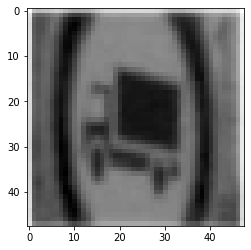

In [51]:
plt.imshow(img, cmap='gray')